<a href="https://colab.research.google.com/github/isa5456/Documentacion/blob/master/P1_template.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Visión por Computador - Práctica 1 - Filtrado de Imágenes

#### 10 puntos   |   Fecha de entrega: 22 de Octubre, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2324.ugr.es/

### Estudiante: <mark>Isabel María Moreno Cuadrado</mark>





---



## Normas de entrega

Para este trabajo, al igual que para los demás, se debe presentar código, resultados, discusión de los mismos, y presentación y análisis del trabajo realizado, todo integrado en este mismo Google Colab Notebook. Se recuerda que código y resultados sin informe explicativo no puntúa.

Este trabajo de implementación tiene como objetivo principal familiarizarse con la implementación y uso de filtros de convolución, así como del cálculo de las derivadas de una imagen y sus posibles aplicaciones.

El diseño de celdas del documento debe ser respetado.

Solo se entregará el código fuente (fichero .ipynb incorporando código, resultados, y explicación del trabajo realizado y los resultados obtenidos) y no se enviarán las imágenes empleadas.

El path para la lectura de imágenes, o cualquier otro fichero de entrada, debe ser siempre “/content/drive/My Drive/images/nombre_fichero”

El código deberá  presentarse con los resultados obtenidos en cada apartado junto con los  correspondientes comentarios y valoraciones. De nuevo, recuerde que la entrega de código sin informe explicativo o valoraciones no puntúa.



---



## Funciones de apoyo y conexión con Google Drive

In [88]:
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [89]:
# We import the modules to use
import os,sys
import cv2, numpy as np, math
from matplotlib import pyplot as plt
# change directory
%cd '/content/drive/My Drive'
#  the current directory
%pwd

# This allows to display images  and to save  them in cells
%matplotlib inline
# this definition allows to read files in a specific path
get_image = lambda route: os.path.join('/content/drive/My Drive/images', route)

/content/drive/My Drive


In [90]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [91]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [92]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im has three-channels
    plt.imshow(im, cmap='jet')
  else:
    # im has a single-channel
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([])
  plt.show()

In [93]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

# **Ejercicio 1: discretización de máscaras y filtrado Gaussiano** (4 puntos).

En este ejercicio aprenderemos a discretizar máscaras de convolución y a aplicarlas sobre imágenes empleando funciones de OpenCV. También buscamos hacerlo de un modo eficiente, y es por ello que, en toda la práctica, se exige el uso de convoluciones 1D (separables).

El documento pdf sobre Gaussian discretization disponible en PRADO (https://pradogrado2324.ugr.es/pluginfile.php/178298/mod_folder/content/0/Material%20de%20Apoyo/Gaussian_discretization.pdf) puede resultar de gran utilidad para la implementación del primer ejercicio.




## A) (1.5 puntos)

Calcule las máscaras discretas 1D de la Gaussiana y tanto su primera como segunda derivadas (normalizadas). Considere que la entrada a dicha función de creación de máscaras 1D puede ser tanto un posible sigma como un posible tamaño de máscara. Emplee los siguientes valores de sigma ($\{1, 2.5, 5\}$) y los siguientes valores de tamaño de máscara ($\{5, 9, 15\}$), y muestre el perfil (es decir, la silueta de las máscaras como funciones 1D) para verificar que las máscaras creadas son correctas.

Lo que haremos será usar la fórmula que vimos en teoría de la gaussiana y con esa expresión y la de sus derivadas realizaremos la discretización.
Calcularemos previamente el sigma o el tamaño de máscara en caso de no ser proporcionados mediante las fórmulas vistas en clase

```
sizeMask = 2 * int(3 * sigma) + 1
sigma = (sizeMask - 1) / 6.0

```
Y luego construiremos la máscara evaluando la función correspondiente en [k-1,..,k+1]
con k = int(3*sigma)
Por último visualizamos el perfil para verificar que las máscaras son correctas.


In [94]:
import numpy as np
import matplotlib.pyplot as plt

# Función Gaussiana
def GaussFunc(x, sigma):
    return np.exp(-x**2 / (2 * sigma**2))

# Primera derivada de la función Gaussiana
def GaussDeriv1Func(x, sigma):
    return np.exp(-x**2 / (2 * sigma**2)) * (-x / (sigma**2))

# Segunda derivada de la función Gaussiana
def GaussDeriv2Func(x, sigma):
    return ((x**2 - sigma**2) / (sigma**4)) * np.exp(-x**2 / (2 * sigma**2))

# Función para crear y mostrar la máscara Gaussiana 1D
def gaussianMask1D(sigma=0, sizeMask=0, order=0):
    # Calcular sigma y sizeMask si no se proporcionan
    if sizeMask == 0:
        sizeMask = 2 * int(3 * sigma) + 1
    if sigma == 0:
        sigma = (sizeMask - 1) / 6.0

    k = int(3 * sigma)  # Parámetro k
    mask = np.zeros(sizeMask)  # Inicializar la máscara
    suma = 0  # Variable para normalizar la máscara

    # Calcular la máscara según el orden especificado
    if order == 0:
        for i in range(-k, k + 1):
            f_x = GaussFunc(i, sigma)
            mask[i + k] = f_x
            suma += f_x
        mask /= suma  # Normalizar la máscara

    elif order == 1:
        for i in range(-k, k + 1):
            mask[i + k] = GaussDeriv1Func(i, sigma)

    elif order == 2:
        for i in range(-k, k + 1):
            mask[i + k] = GaussDeriv2Func(i, sigma)

    # Crear un vector para la posición
    #vector = np.arange(-k, k + 1)

    # Graficar la máscara
    #plt.plot(vector, mask, label=f'Máscara {order}')
    #plt.xlabel('Posición')
    #plt.ylabel('Valor')
    #plt.title(f'Perfil de la Máscara Gaussiana (σ={sigma}, Tamaño={sizeMask})')
    #plt.legend()
    #plt.show()

    return mask


Como vemos obtenemos resultados acordes con lo que esperábamos lo cual nos indica que hemos realizado de manera correcta la discretización.


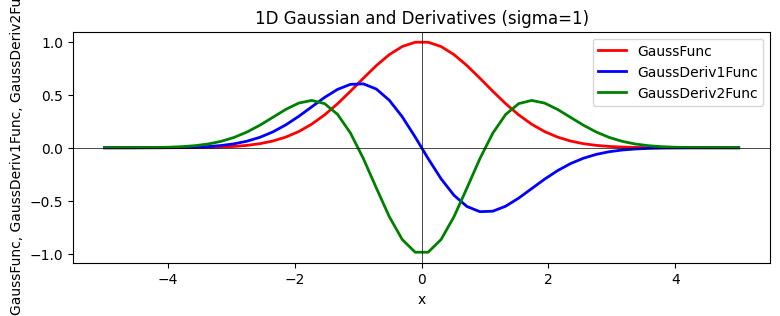

In [95]:
# Con la siguiente figura verificamos que las funciones Gaussianas implementadas son correctas
plt.figure()
xvalues = np.linspace(-5, 5)
yvalues1 = GaussFunc(xvalues,1)
yvalues2 = GaussDeriv1Func(xvalues,1)
yvalues3 = GaussDeriv2Func(xvalues,1)
plt.plot(xvalues, yvalues1, lw=2, color='red',
label='GaussFunc')
plt.plot(xvalues, yvalues2, lw=2, color='blue',
label='GaussDeriv1Func')
plt.plot(xvalues, yvalues3, lw=2, color='green',
label='GaussDeriv2Func')
plt.title('1D Gaussian and Derivatives (sigma=1)')
plt.xlabel('x')
plt.ylabel('GaussFunc, GaussDeriv1Func, GaussDeriv2Func')
plt.axhline(0, lw=0.5, color='black')
plt.axvline(0, lw=0.5, color='black')
plt.legend()

FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA


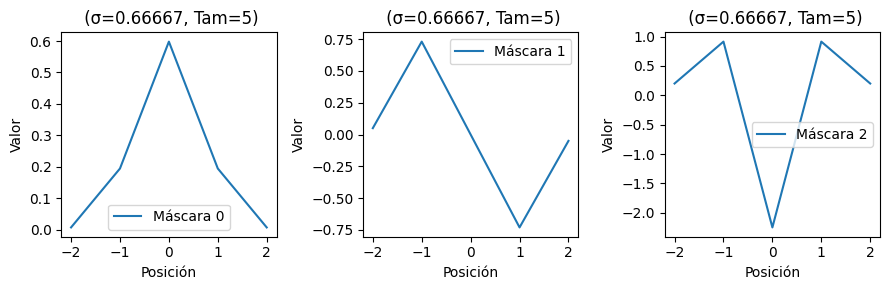

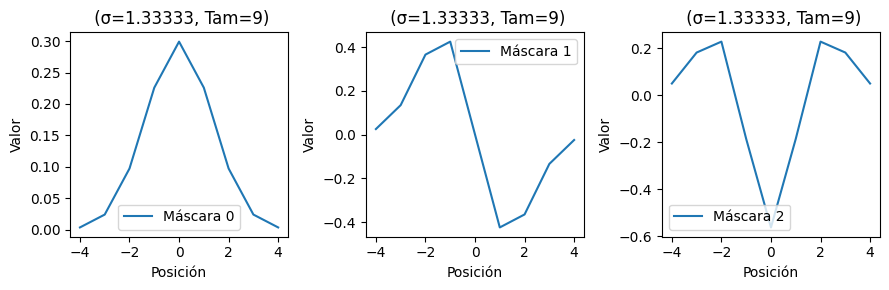

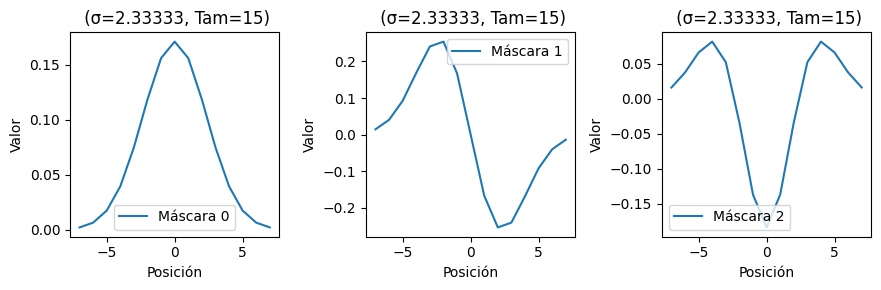

FIJAMOS AHORA EL SIGMA


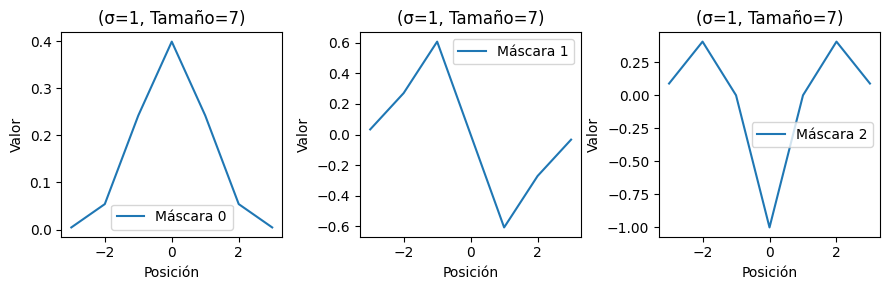

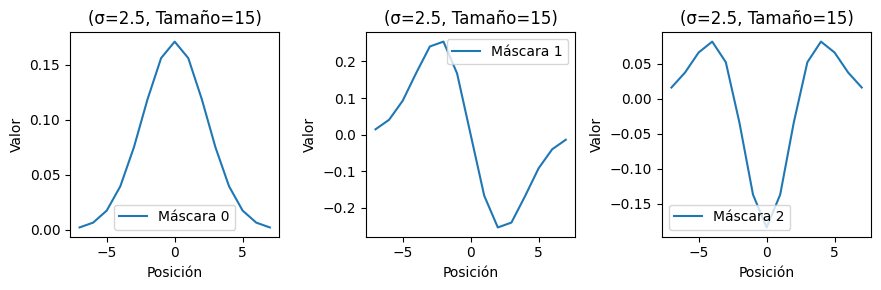

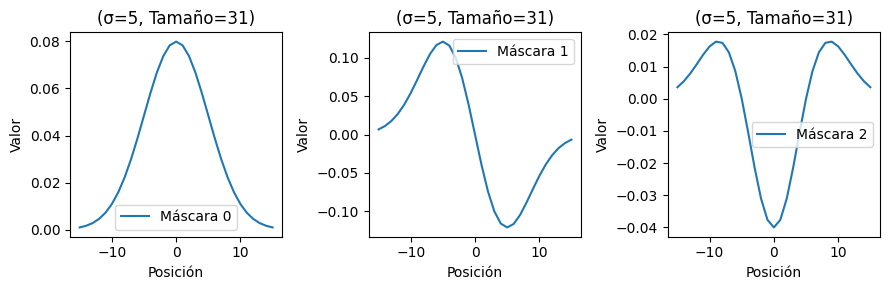

In [96]:
import numpy as np
import matplotlib.pyplot as plt

# Definiciones de funciones GaussFunc, GaussDeriv1Func, GaussDeriv2Func, gaussianMask1D

sigma_values = [1, 2.5, 5]
size_masks = [5, 9, 15]

plt.rcParams["figure.figsize"] = (9, 3)  # Tamaño general de la figura

print('FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA')
for sizeMask in size_masks:
    fig, axs = plt.subplots(1, 3)  # Organiza gráficos en una fila con 3 columnas
    for i in range(3):
        mask = gaussianMask1D(0, sizeMask, order=i)
        sigma = (sizeMask - 1) / 6.0
        k = int(3*sigma)
        vector = np.arange(-k, k + 1)
        axs[i].plot(vector, mask, label=f'Máscara {i}')
        axs[i].set_xlabel('Posición')
        axs[i].set_ylabel('Valor')
        axs[i].set_title(f' (σ={sigma:.5f}, Tam={sizeMask})')
        axs[i].legend()
    plt.tight_layout()
    plt.show()

print('FIJAMOS AHORA EL SIGMA')
for sigma in sigma_values:
    fig, axs = plt.subplots(1, 3)  # Organiza gráficos en una fila con 3 columnas
    for i in range(3):
        gaussianMask1D(sigma, 0, order=i)
        k = int(3*sigma)
        sizeMask = 2 * k+ 1
        vector = np.arange(-k, k + 1)
        mask = gaussianMask1D(0, sizeMask, order=i)
        axs[i].plot(vector, mask, label=f'Máscara {i}')
        axs[i].set_xlabel('Posición')
        axs[i].set_ylabel('Valor')
        axs[i].set_title(f'(σ={sigma}, Tamaño={sizeMask})')
        axs[i].legend()
    plt.tight_layout()
    plt.show()



## B) (1.5 puntos)

Lea una imagen en escala de grises y fíltrela mostrando el resultado de la convolución con una Gaussiana, con la primera derivada de la Gaussiana (tanto en X como en Y), y con la segunda derivada de la Gaussiana (tanto en X como en Y). Emplee los siguientes sigmas: $\{0.75,2,5,10,15\}$. Muestra todas las imágenes dentro del mismo canvas, tal y como se muestra más abajo. En este apartado, se debe usar la función de OpenCV `sepFilter2D()` con las máscaras calculadas con las funciones desarrolladas en el apartado anterior.




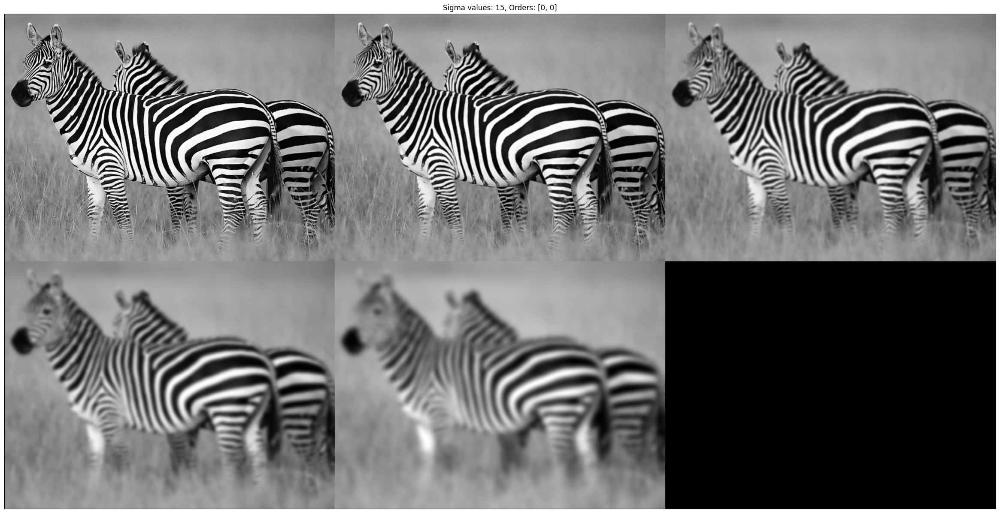

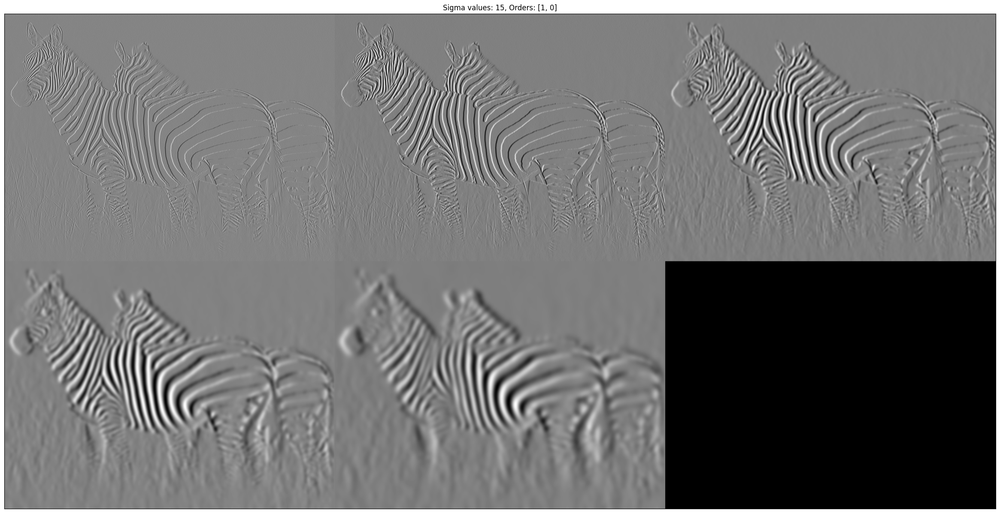

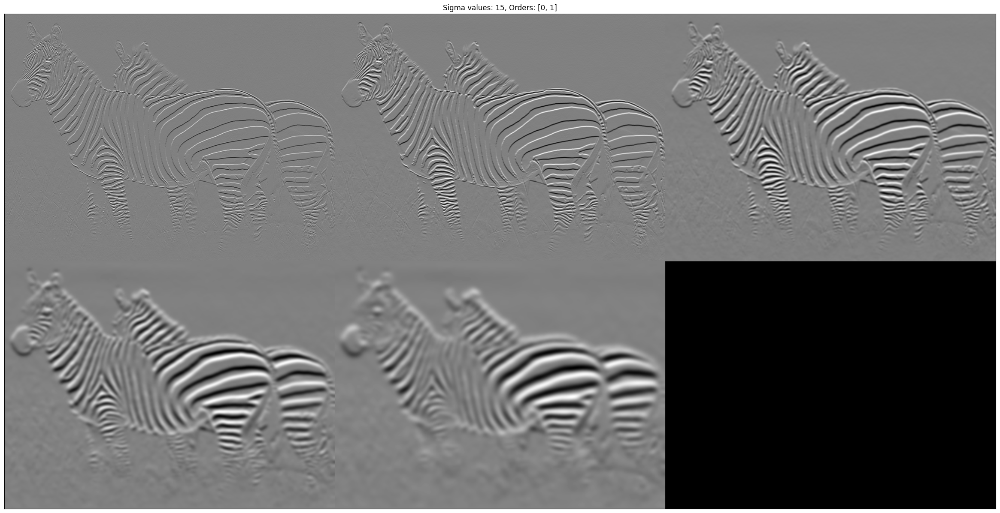

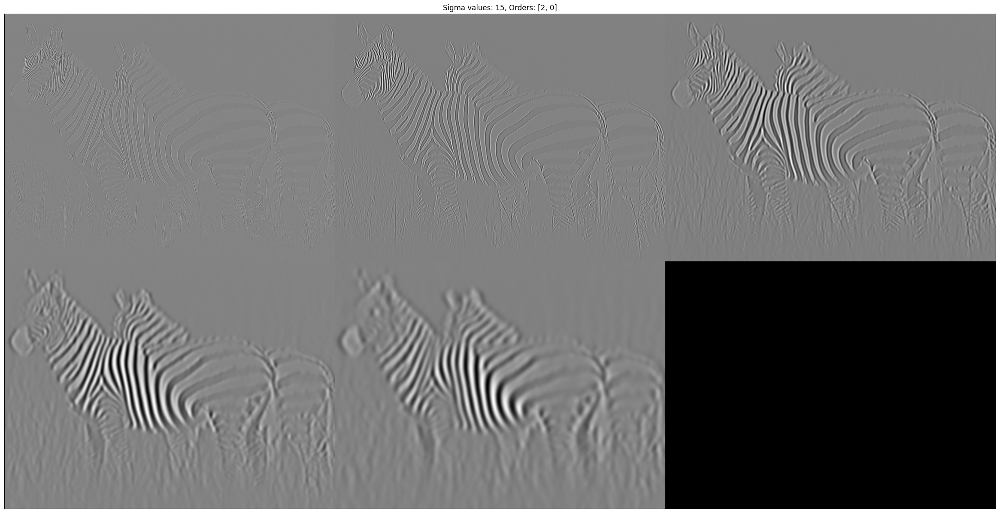

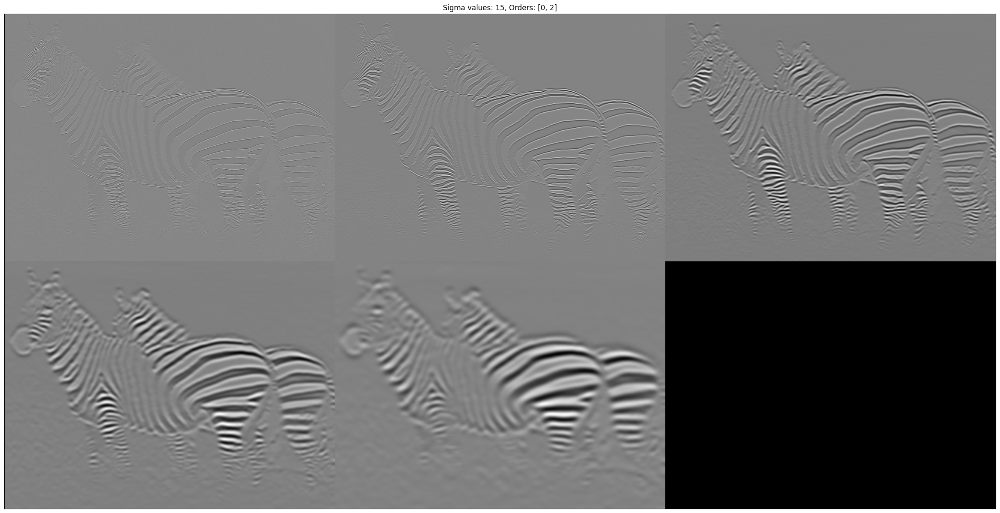

In [101]:
def MostrarImagenes(im,orders):
  vim0 = []
  for sigma in [0.75,2,5,10,15]:
    vim0.append(rangeDisplay01(my2DConv(im, sigma, order), True))
  displayMI_ES(vim0, f'Sigma values: {sigma}, Orders: {orders}', len(vim0))

def my2DConv(im, sigma, orders):
    ddepth = cv2.CV_64F
    maskG = gaussianMask1D(sigma, order=0)
    maskDG = gaussianMask1D(sigma, order=1)
    mask2DG = gaussianMask1D(sigma, order=2)

    if orders == [0, 0]:  # Suavizado Gaussiano
        return cv2.sepFilter2D(im, ddepth, maskG, maskG)
    elif orders == [1, 0]:  # Primer derivada en X
        return cv2.sepFilter2D(im, ddepth, maskDG, maskG)
    elif orders == [0, 1]:  # Primer derivada en Y
        return cv2.sepFilter2D(im, ddepth, maskG, maskDG)
    elif orders == [2, 0]:  # Segunda derivada en X
        return cv2.sepFilter2D(im, ddepth, mask2DG, maskG)
    elif orders == [0, 2]:  # Segunda derivada en Y
        return cv2.sepFilter2D(im, ddepth, maskG, mask2DG)
    else:
        print('error in order of derivative')


# Ordenes
orders_to_test = [[0, 0], [1, 0], [0, 1], [2, 0], [0, 2]]
im = cv2.imread(get_image('zebra.jpg'), cv2.IMREAD_GRAYSCALE)

# Mostrar la imagen para cada orden
for order in orders_to_test:
    MostrarImagenes(im,order)

## C) (1 punto)

Emplee la función de OpenCV `sepFilter2D()` y $\sigma=3.0$ para calcular el gradiente (4 imágenes: derivada en X, derivada en Y, magnitud y orientación) y la Laplaciana de la Gaussiana.

# **Ejercicio 2**:  Pirámides Gaussianas y Laplacianas (3 points)







## A) (1.5 puntos)

Construya una pirámide Gaussiana de 4 niveles empleando máscaras Gaussianas de tamaño 7x7. No se permite emplear las funciones `pyrUp()` y `pyrDown()` de OpenCV.

In [ ]:
'''
This function displays a pyramid of images, providing as input the list of images to display.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1, cv2.resize(im1,(im1.shape[0]//2,im1.shape[1]//2),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//4,im1.shape[1]//4),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//8,im1.shape[1]//8),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//16,im1.shape[1]//16),cv2.INTER_LINEAR)]

displayPyramid(images, title='Piramide de Manzanas')

'''
def displayPyramid(vim, title='result'):
  temp = np.zeros_like(vim[0])
  if np.mod(temp.shape[1],2)==0:
    h = temp[:, :temp.shape[1]//2]
  else:
    h = temp[:, :(temp.shape[1]//2)+1]
  out = np.hstack((temp, h))
  top = 0
  out[0:vim[0].shape[0], 0:vim[0].shape[1]] = vim[0]
  left = vim[0].shape[1]
  for i in range(1, len(vim)):
    out[top:top+vim[i].shape[0], left:left + vim[i].shape[1]] = vim[i]
    top += vim[i].shape[0]
  displayIm(out, title)

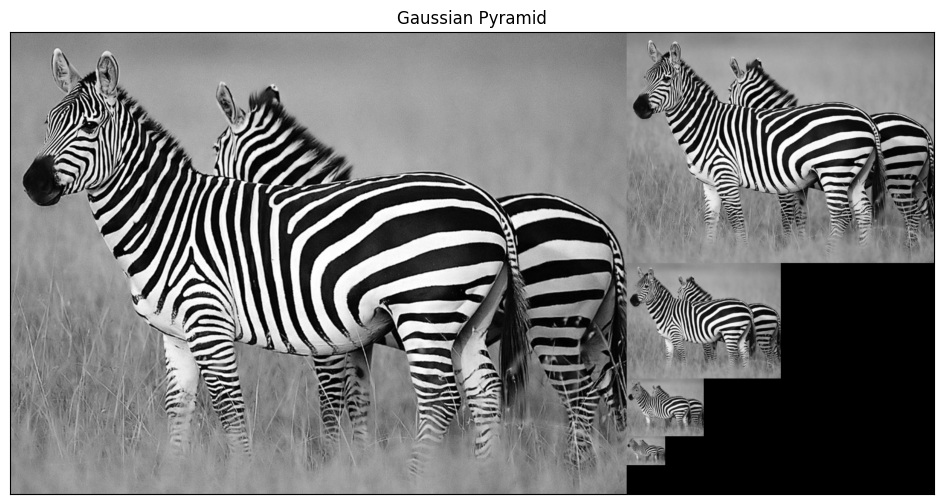

In [ ]:
def pyramidGauss(im,sizeMask=7, nlevel=4):
  vim=[im]
  #A COMPLETAR POR EL ALUMNADO
  return vim

im=cv2.imread(get_image('zebra.jpg'),0)
pyrG = pyramidGauss(im,sizeMask=7, nlevel=4)
displayPyramid(pyrG,'Gaussian Pyramid')


## B) (1 punto)

Use su código del apartado anterior para implementar una función que permita construir una pirámide Laplaciana de 4 niveles.

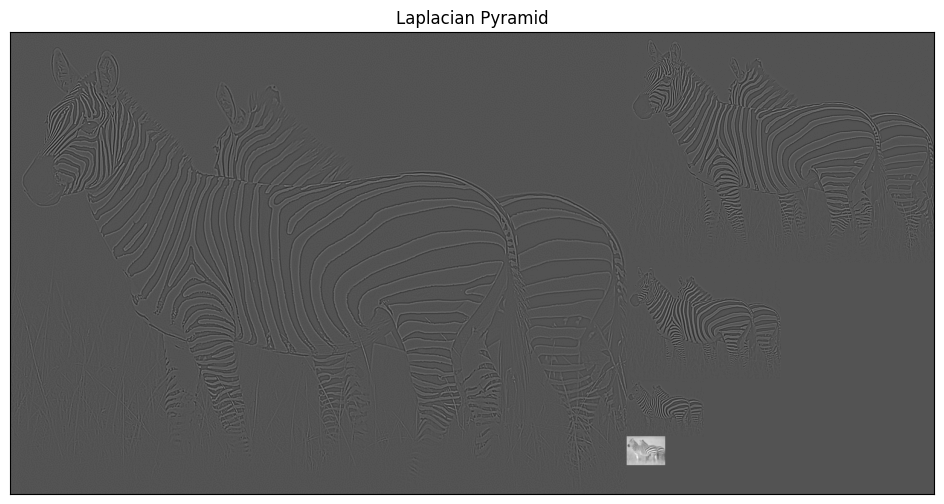

In [ ]:
def pyramidLap(im, sizeMask,nlevel=4,flagInterp=cv2.INTER_LINEAR  ):
  vim=pyrG=pyramidGauss(im,sizeMask=sizeMask, nlevel=nlevel)
  vimL=[]
  #A COMPLETAR POR EL ALUMNADO
  return vimL

im=cv2.imread(get_image('zebra.jpg'),0)
pyrL = pyramidLap(im,sizeMask=7, nlevel=4)
displayPyramid(pyrL,'Laplacian Pyramid')

## C) (0.5 puntos)

Implemente ahora una función para reconstruir la imagen codificada en la pirámide Laplaciana. Verifique que es posible obtener una copia exacta de la imagen original. Para ello, calcule el error de reconstrucción como la norma Euclídea de las diferencias entre los niveles de intensidad de la imagen original y la imagen reconstruida.

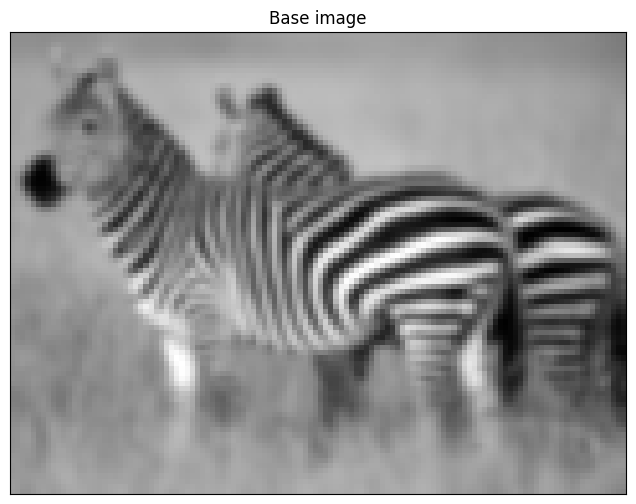

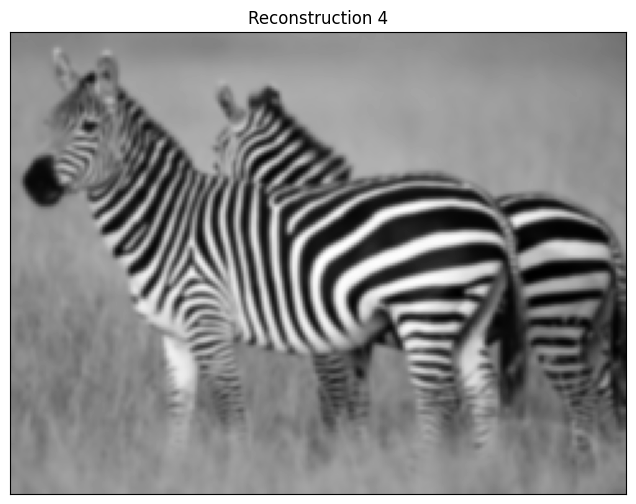

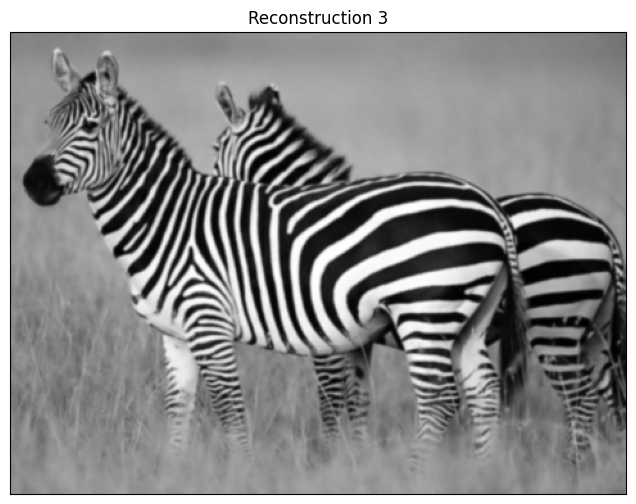

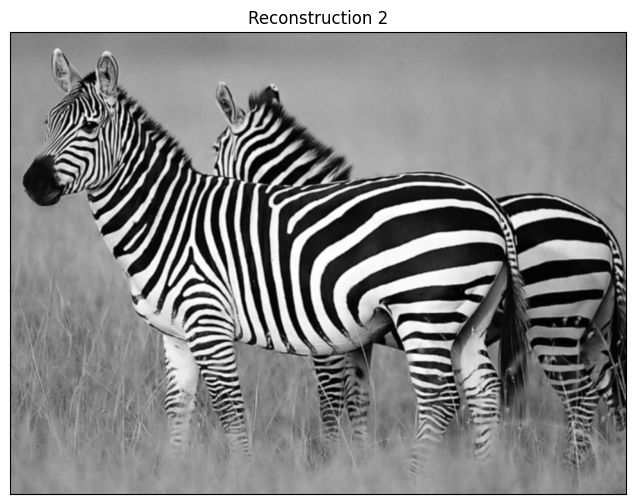

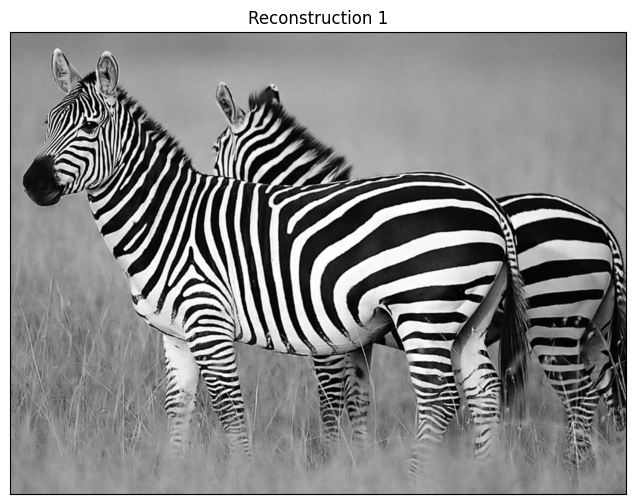

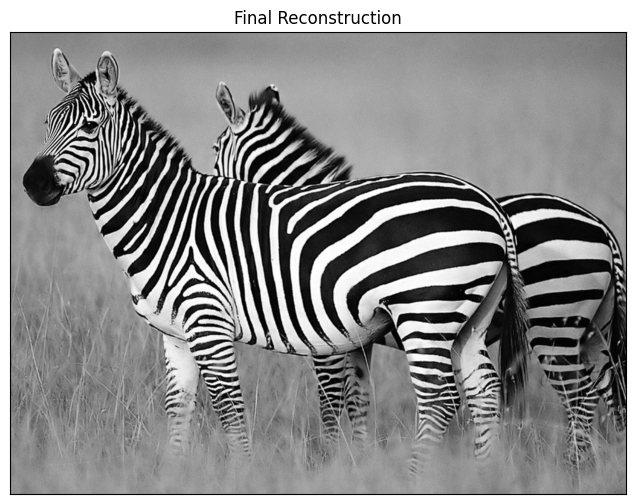

Error per pixel 0.0


In [ ]:
def reconstructLap(pyL,flagInterp):
  #A COMPLETAR POR EL ALUMNADO
  return im

#A COMPLETAR POR EL ALUMNADO
print('Error per pixel',np.sqrt(np.linalg.norm(im-np.round(recons), ord=2)/np.prod(im.shape)))

# **Ejercicio 3: Imágenes Híbridas** (2 puntos)

Este ejercicio se basa en el siguiente trabajo: $\textit{Oliva, A., Torralba, A., & Schyns, P. G. (2006). Hybrid images. ACM Transactions on Graphics (TOG), 25(3), 527-532}$. (https://stanford.edu/class/ee367/reading/OlivaTorralb_Hybrid_Siggraph06.pdf).  

El objetivo es aprender cómo el sistema visual humano extrae información sobre un objeto en función de la distancia. Para ello, construimos una imagen híbrida a partir de dos imágenes de objetos diferentes. Mezclando adecuadamente parte de las altas frecuencias de una imagen con parte de las bajas frecuencias de otra imagen, obtenemos una imagen híbrida que muestra diferentes percepciones con la distancia. El sigma empleado para filtrar ambas imágenes (tanto la de alta como la de bajas frecuencias) es el aspecto clave para seleccionar el rango de frecuencias altas y bajas de cada imagen. Cuanto mayor sea el valor sigma, mayor será la eliminación de altas frecuencias de la imagen. Se recomienda elegir este valor por separado para cada una de las imágenes y, de hecho, seguramente sea posible (y deseable) el tener distintos valores para distintos pares de imágenes. Recuerde emplear la pirámide Gaussiana para mostrar el efecto obtenido.

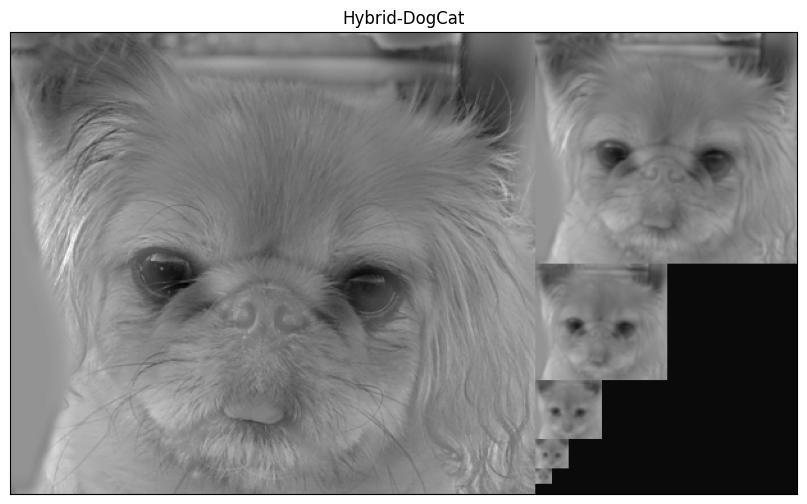

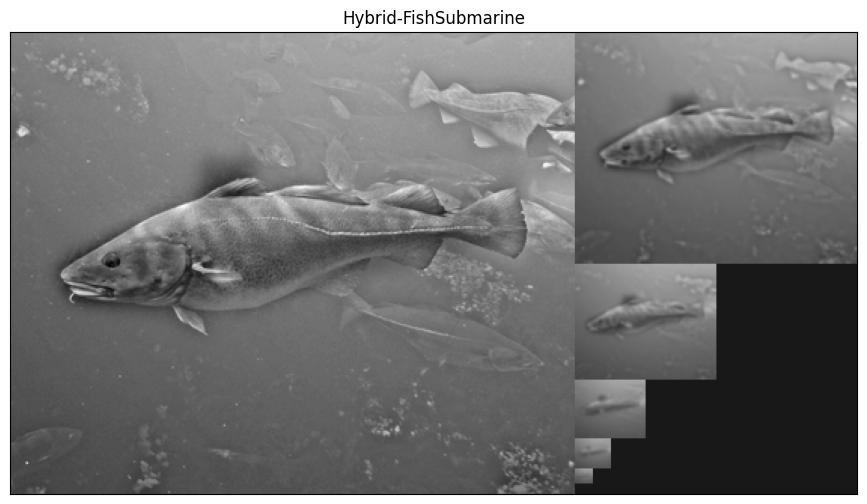

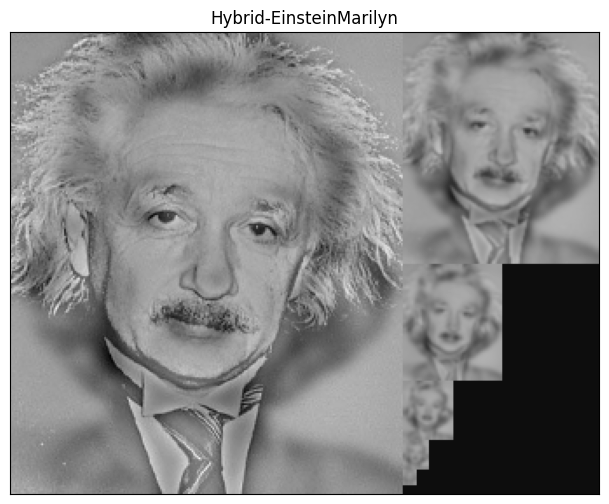

In [ ]:
#A COMPLETAR POR EL ALUMNADO

# **Ejercicio 4: Pyramid Blending** (1 punto)

En este ejercicio se debe crear la imagen fusionada (horizontal) de la manzana (`apple.jpg`) y la naranja (`orange.jpg`) empleando la técnica de $\textit{Pyramid Blending}$. Para este ejercicio, si se desea, sí se pueden emplear las funciones de OpenCV `pyrDown` y `pyrUp`. Para que el ejercicio puntúe, es esencial explicar en detalle el proceso seguido a la hora de crear la nueva imagen (mezcla de ambas). El resultado debe ser similar al mostrado en la celda de resultados correspondiente.  



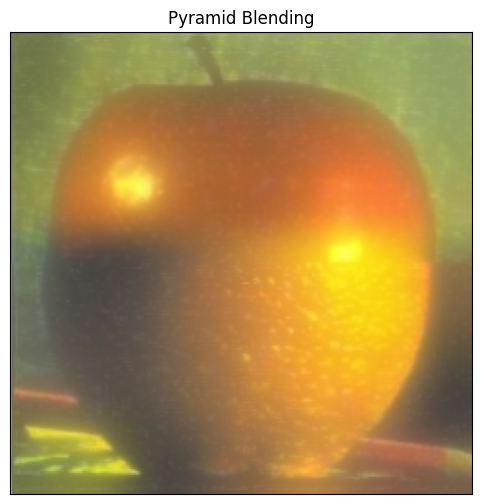

In [ ]:
#A COMPLETAR POR EL ALUMNADO
